# Barren Plateaus in Softmax Policies 

### Contents

1. [Random circuit with nearest neighbour entangling single layer](#random)
2. [Rx parameterized model presented in Cost function barren plateaus](#rx)
3. [Rx with Log Policy](#rxlog)
4. [Strongly Entangling Layer](#SEL)
5. [Strongly Entangling Layers](#SELLayers)
5. [Random circuit with multiple layers](#randomlayers)

In [1]:
import pennylane as qml
from pennylane import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Categorical
import functools


## Random circuit with nearest neighbour entangling single layer <a name="random"></a>

In [258]:
qubits = [2, 3, 4, 5, 6, 8, 10]
variances_global = []
variances_local = []
exp_global=[]
exp_local=[]
num_samples = 1000

for n_qubits in qubits:
    print("number of qubits - ", n_qubits)
    grad_vals_global = []
    grad_vals_local = []
    for i in range(num_samples):
        dev = qml.device("default.qubit", wires=n_qubits)
        dev2 = qml.device("default.qubit", wires=n_qubits)

        gate_set = [qml.RX, qml.RY, qml.RZ]
        random_gate_sequence = {i: np.random.choice(gate_set) for i in range(n_qubits)}
        random_gate_sequence2 = {i: np.random.choice(gate_set) for i in range(n_qubits)}

        @qml.qnode(dev)#, interface="torch", diff_method="backprop")
        def rand_circuit_global(inputs,params):
            
            for i in range(n_qubits):
                qml.Hadamard(wires=i)#(np.pi/4, wires=i)

            for i in range(n_qubits):
                random_gate_sequence[i](params[0][i], wires=i)

            
            for i in range(n_qubits - 1):
                qml.CNOT(wires=[i, i + 1])
            
            for i in range(n_qubits):
                random_gate_sequence2[i](params[1][i], wires=i)

            ZZ = qml.operation.Tensor(qml.PauliZ(0), qml.PauliZ(1))
            XX = qml.operation.Tensor(qml.PauliX(0), qml.PauliX(1))
            for i in range(2,n_qubits):
                ZZ = qml.operation.Tensor(ZZ, qml.PauliZ(i))
                XX = qml.operation.Tensor(XX, qml.PauliX(i))

            return [qml.expval(ZZ)  , qml.expval(ZZ)]

        @qml.qnode(dev2)#, interface="torch")#, diff_method="backprop")
        def rand_circuit_local(inputs,params):

            for i in range(n_qubits):
                qml.Hadamard(wires=i)#(np.pi/4, wires=i)

            for i in range(n_qubits):
                random_gate_sequence[i](params[0][i], wires=i)

            
            for i in range(n_qubits - 1):
                qml.CNOT(wires=[i, i + 1])

            for i in range(n_qubits):
                random_gate_sequence2[i](params[1][i], wires=i)

            coeffsz = [1.0]*n_qubits
            coeffsx = [1.0]*n_qubits
            obsz = [qml.PauliZ(i) for i in range(n_qubits)]
            #obsz = [qml.Projector([0],wires=i) for i in range(n_qubits)]
            obsx = [qml.PauliX(i) for i in range(n_qubits)]
            HZ = qml.Hamiltonian(coeffsz, obsz)
            HX = qml.Hamiltonian(coeffsx, obsx)

            return [qml.expval(HZ), qml.expval(HZ)]

        class global_policy(nn.Module):        
            def __init__(self, init):
                super(global_policy, self).__init__()
                weight_shapes = {"params": init.shape}

                self.uniform = functools.partial(torch.nn.init.uniform_, a=-np.pi, b=np.pi)
                self.glorot = functools.partial(torch.nn.init.normal_, mean=0.0, std=np.sqrt(1/3))
                self.normal = functools.partial(torch.nn.init.normal_, mean=0.0, std=1)
                init_method = {"params": init}
                self.qlayer = qml.qnn.TorchLayer(rand_circuit_global, weight_shapes=weight_shapes, init_method=init_method)
        


            def forward(self):
                #QUANTUM ACTION SELECTION
                out = self.qlayer(torch.ones(2))
                #out=self.fc1(out)
                out[1] *= -1
                #out = torch.multiply(self.ws,out)
                action_probs = F.softmax(out, dim=-1)
                #probs = self.forward(state)
                #m = Categorical(action_probs)
                #action = m.sample()
                #return m.log_prob(action)
                return torch.log(action_probs[0])
        
        class local_policy(nn.Module):        
            def __init__(self, init):
                super(local_policy, self).__init__()
                weight_shapes = {"params":init.shape}

                self.uniform = functools.partial(torch.nn.init.uniform_, a=-np.pi, b=np.pi)
                self.glorot = functools.partial(torch.nn.init.normal_, mean=0.0, std=np.sqrt(1/3))
                self.normal = functools.partial(torch.nn.init.normal_, mean=0.0, std=1)
                init_method = {"params": init}
                self.qlayer = qml.qnn.TorchLayer(rand_circuit_local, weight_shapes=weight_shapes, init_method=init_method)
        
            def forward(self):
                #QUANTUM ACTION SELECTION
                out = self.qlayer(torch.ones(2))
                out[1] *= -1
                #out=self.fc1(out)
                #out = torch.multiply(self.ws,out)
                action_probs = F.softmax(out, dim=-1)
                #probs = self.forward(state)
                #m = Categorical(action_probs)
                #action = m.sample()
                #return m.log_prob(action)
                return torch.log(action_probs[0])
            
        #params = np.random.random(size=n_qubits, requires_grad = True)
        w = np.random.random(size=(2,n_qubits))
        #w2 = np.random.random(size=n_qubits)
        w2=np.copy(w)
        params = torch.tensor(w, requires_grad = True)
        params2 = torch.tensor(w2, requires_grad = True)

        gp = global_policy(params)
        lp = local_policy(params2)

        #grad_global = qml.grad(global_loss,argnum=0)#(params)
        #grad_vals_global.append(np.mean(grad_global(params)))#grad_global))
        #global_cost = global_loss(params)
        #global_cost.backward()

        logprob_gp = gp.forward()
        logprob_gp.backward()
        grad_global = gp.qlayer.params.grad
        #grad_global = params.grad
        grad_vals_global.append(np.mean(grad_global.numpy()))#grad_global))

        #local_cost = local_loss(params2)
        logprob_lp = lp.forward()
        logprob_lp.backward()
        grad_local = lp.qlayer.params.grad
        #local_cost.backward()
        #grad_local = params2.grad
        grad_vals_local.append(np.mean(grad_local.numpy()))#grad_global))

    variances_global.append(np.var(grad_vals_global))
    variances_local.append(np.var(grad_vals_local))
    exp_global.append(np.mean(grad_vals_global))
    exp_local.append(np.mean(grad_vals_local))

variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)


number of qubits -  2
number of qubits -  3
number of qubits -  4
number of qubits -  5
number of qubits -  6
number of qubits -  8
number of qubits -  10


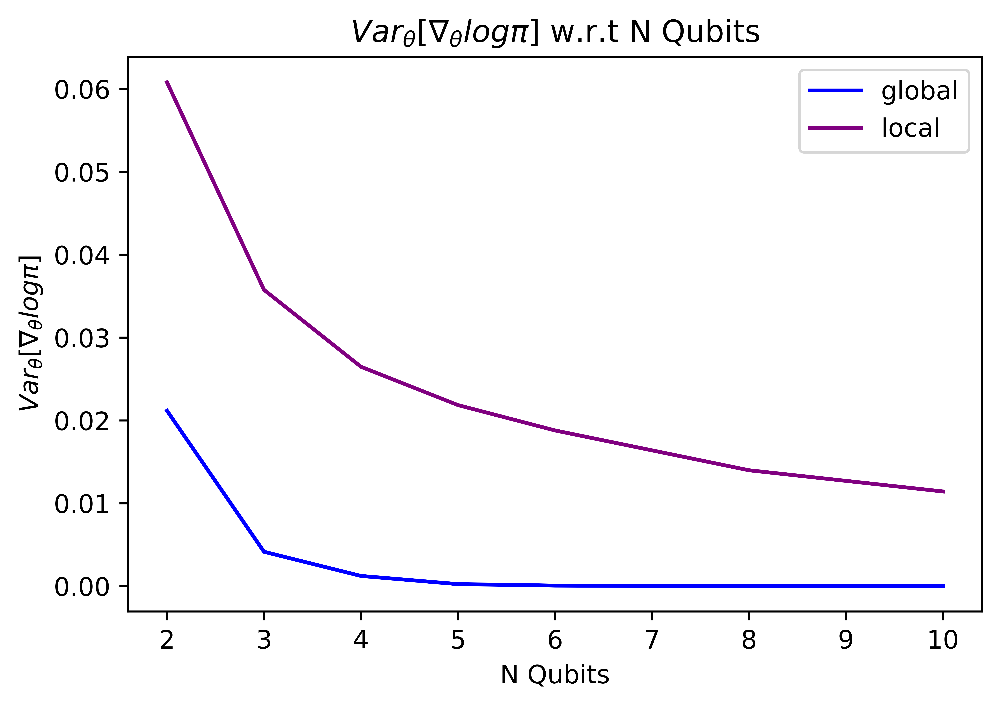

In [259]:
variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,variances_global, color="blue", label="global")
plt.plot(qubits,variances_local, color="purple", label="local")
plt.legend()
plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.xlabel("N Qubits")
plt.show()

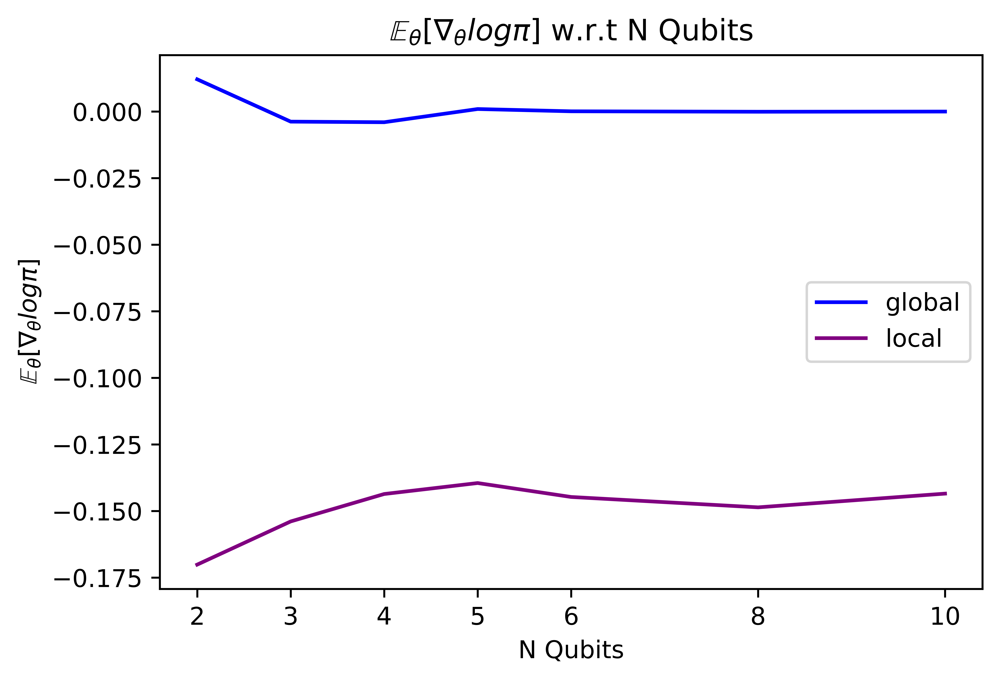

In [260]:
exp_global = np.array(exp_global)
exp_local = np.array(exp_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,exp_global, color="blue", label="global")
plt.plot(qubits,exp_local, color="purple", label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("N Qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()

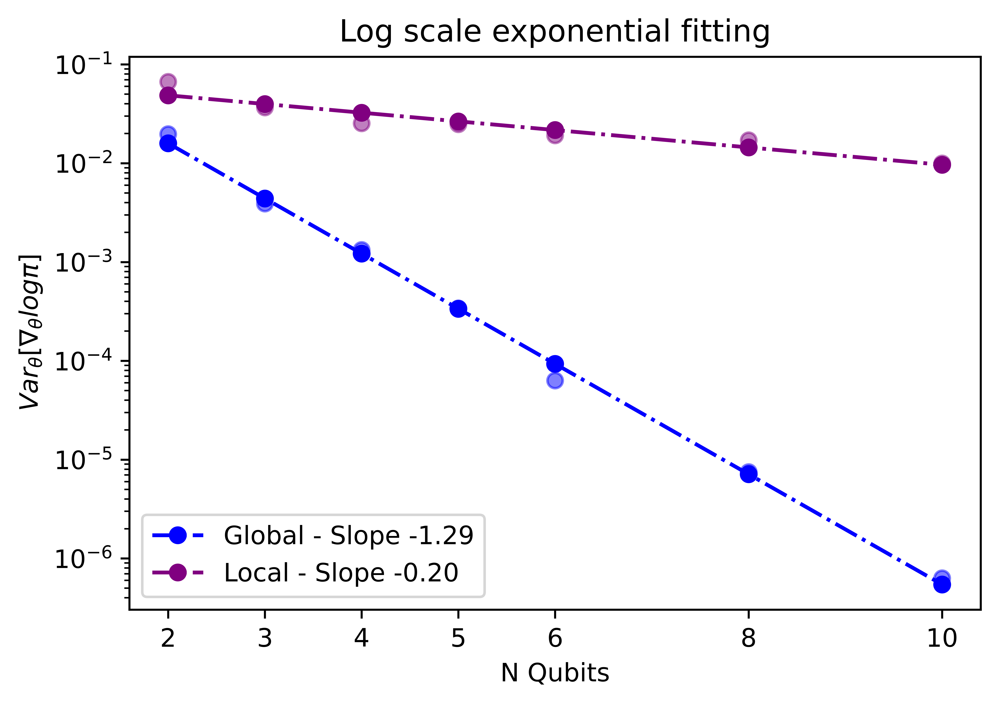

In [225]:
p = np.polyfit(qubits, np.log(variances_global), 1)
p2 = np.polyfit(qubits, np.log(variances_local), 1)

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.semilogy(qubits, variances_global, "o" , color="blue" , alpha=0.5)
plt.semilogy(qubits, np.exp(p[0] * qubits + p[1]), "o-.", color="blue", label="Global - Slope {:3.2f}".format(p[0]))
plt.semilogy(qubits, variances_local, "o" , color="purple", alpha=0.5)
plt.semilogy(qubits,  np.exp(p2[0] * qubits + p2[1]), "o-.", color="purple", label="Local - Slope {:3.2f}".format(p2[0]))
plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend()
plt.title("Log scale exponential fitting")
plt.show()

## Strongly entangling layers single layer <a name="SEL"></a>

In [262]:
qubits = [2, 3, 4, 5, 6, 8, 10]
variances_global = []
variances_local = []
exp_global=[]
exp_local=[]
num_samples = 1000


def ansatz(weights, n_layers=1, change_of_basis=False, entanglement="all2all"):
        if change_of_basis==True:
            for i in range(n_qubits):
                qml.RZ(weights[1][i][0],wires=i)
                qml.RY(weights[1][i][1],wires=i)
                qml.RZ(weights[1][i][2],wires=i)
        else:

            for l in range(n_layers):

                for i in range(len(weights[l])):
                    qml.RZ(weights[l][i][0],wires=i)
                    qml.RY(weights[l][i][1],wires=i)
                    qml.RZ(weights[l][i][2],wires=i)

                if entanglement == "all2all":
                    for q1 in range(n_qubits-1):    
                        for q2 in range(q1+1, n_qubits):
                            #qml.CNOT(wires=[q1,q2])
                            qml.CZ(wires=[q1,(q1+l+1)%n_qubits])

                
                elif entanglement == "mod":
                    if not (l+1)%n_qubits:
                        l=0
                    for q1 in range(n_qubits):
                        qml.CNOT(wires=[q1,(q1+l+1)%n_qubits])
                        #qml.CZ(wires=[q1,(q1+l+1)%n_qubits])

                elif entanglement == "linear":
                    for q1 in range(n_qubits-1):    
                        qml.CNOT(wires=[q1,q1+1])

                elif entanglement == "circular":
                    #if l+1 < n_layers:
                    for q1 in range(n_qubits):
                        qml.CNOT(wires=[q1,(q1+1)%n_qubits])
                        #qml.CZ(wires=[q1,(q1+1)%n_qubits])

                
                elif entanglement == "nn":
                    qml.CNOT(wires=[0,1])
                    qml.CNOT(wires=[2,3])
                    qml.CNOT(wires=[1,2])


for n_qubits in qubits:
    print("number of qubits - ", n_qubits)
    grad_vals_global = []
    grad_vals_local = []
    for i in range(num_samples):
        dev = qml.device("default.qubit", wires=n_qubits)
        dev2 = qml.device("default.qubit", wires=n_qubits)

        gate_set = [qml.RX, qml.RY, qml.RZ]
        random_gate_sequence = {i: np.random.choice(gate_set) for i in range(n_qubits)}

        @qml.qnode(dev)#, interface="torch", diff_method="backprop")
        def rand_circuit_global(inputs,params):

            #qml.StronglyEntanglingLayers(weights=params, wires=range(n_qubits),imprimitive=qml.ops.CZ)
            for i in range(n_qubits):
                qml.Hadamard(wires=i)#(np.pi, wires=i)

            ansatz(params, n_layers=1, entanglement="mod")
            ansatz(params, change_of_basis=True)

            ZZ = qml.operation.Tensor(qml.PauliZ(0), qml.PauliZ(1))
            XX = qml.operation.Tensor(qml.PauliX(0), qml.PauliX(1))
            YY = qml.operation.Tensor(qml.PauliY(0), qml.PauliY(1))
            
            for i in range(2,n_qubits):
                ZZ = qml.operation.Tensor(ZZ, qml.PauliZ(i))
                XX = qml.operation.Tensor(XX, qml.PauliX(i))
                YY = qml.operation.Tensor(YY, qml.PauliY(i))

            return qml.expval(ZZ) , qml.expval(XX)

        @qml.qnode(dev2)#, interface="torch", diff_method="backprop")
        def rand_circuit_local(inputs,params):

            #qml.StronglyEntanglingLayers(weights=params, wires=range(n_qubits))
            for i in range(n_qubits):
                qml.Hadamard(wires=i)#(np.pi, wires=i)
                
            ansatz(params, n_layers=1, entanglement="mod")
            ansatz(params, change_of_basis=True)

            coeffsz = [1.0]*n_qubits
            coeffsx = [1.0]*n_qubits
            obsz=[]
            obsx=[]
            for i in range(n_qubits):
                #coeffsz.append(1/n_qubits)
                obsz.append(qml.PauliZ(i))
                #obsz.append(qml.Projector([0],wires=i))
                #coeffsz.append(-1/n_qubits)
                #obsz.append(qml.Projector([1],wires=i))
                #obsx.append(qml.PauliX(i))
                #coeffsx.append(-1/n_qubits)
                #obsx.append(qml.Projector([0],wires=i))
                #coeffsx.append(1/n_qubits)
                obsx.append(qml.PauliX(i))


            HZ = qml.Hamiltonian(coeffsz, obsz)
            HX = qml.Hamiltonian(coeffsx, obsx)

            return qml.expval(HZ), qml.expval(HX)
        
        class global_policy(nn.Module):        
            def __init__(self, init):
                super(global_policy, self).__init__()
                weight_shapes = {"params":init.shape}

                self.uniform = functools.partial(torch.nn.init.uniform_, a=-np.pi, b=np.pi)
                self.glorot = functools.partial(torch.nn.init.normal_, mean=0.0, std=np.sqrt(1/3))
                self.normal = functools.partial(torch.nn.init.normal_, mean=0.0, std=1)
                init_method = {"params": init}
                self.qlayer = qml.qnn.TorchLayer(rand_circuit_global, weight_shapes=weight_shapes, init_method=init_method)
        


            def forward(self):
                #QUANTUM ACTION SELECTION
                out = self.qlayer(torch.ones(2))
                #out[1] *= -1
                #out=self.fc1(out)
                #out = torch.multiply(self.ws,out)
                action_probs = F.softmax(out, dim=-1)
                #probs = self.forward(state)
                #m = Categorical(action_probs)
                #action = m.sample()
                #return m.log_prob(action)
                return torch.log(action_probs[0])
        
        class local_policy(nn.Module):        
            def __init__(self, init):
                super(local_policy, self).__init__()
                weight_shapes = {"params":init.shape}

                self.uniform = functools.partial(torch.nn.init.uniform_, a=-np.pi, b=np.pi)
                self.glorot = functools.partial(torch.nn.init.normal_, mean=0.0, std=np.sqrt(1/3))
                self.normal = functools.partial(torch.nn.init.normal_, mean=0.0, std=1)
                init_method = {"params": init}
                self.qlayer = qml.qnn.TorchLayer(rand_circuit_local, weight_shapes=weight_shapes, init_method=init_method)
        
            def forward(self):
                #QUANTUM ACTION SELECTION
                out = self.qlayer(torch.ones(2))
                #out[1] *= -1
                #out=self.fc1(out)
                #out = torch.multiply(self.ws,out)
                action_probs = F.softmax(out, dim=-1)
                #probs = self.forward(state)
                #m = Categorical(action_probs)
                #action = m.sample()
                #return m.log_prob(action)
                return torch.log(action_probs[0])

        #params = np.random.random(size=n_qubits, requires_grad = True)
        shape = qml.StronglyEntanglingLayers.shape(n_layers=2, n_wires=n_qubits)
        weights = np.random.random(size=(2,n_qubits,3))      
        weights2 = np.copy(weights)
        params = torch.tensor(weights, requires_grad = True)
        params2 = torch.tensor(weights2, requires_grad = True)

        gp = global_policy(params)
        lp = local_policy(params2)

        #grad_global = qml.grad(global_loss,argnum=0)#(params)
        #grad_vals_global.append(np.mean(grad_global(params)))#grad_global))
        #global_cost = global_loss(params)
        #global_cost.backward()

        #opt = torch.optim.SGD(gp.parameters(), lr=0.01)
        #opt.zero_grad()
        logprob_gp = gp.forward()
        logprob_gp.backward()
        grad_global = gp.qlayer.params.grad
        #grad_global = params.grad
        grad_vals_global.append(np.mean(grad_global.numpy()))#grad_global))

        #local_cost = local_loss(params2)
        #opt = torch.optim.SGD(lp.parameters(), lr=0.01)
        #opt.zero_grad()
        logprob_lp = lp.forward()
        logprob_lp.backward()
        grad_local = lp.qlayer.params.grad
        #local_cost.backward()
        #grad_local = params2.grad
        grad_vals_local.append(np.mean(grad_local.numpy()))#grad_global))

    variances_global.append(np.var(grad_vals_global))
    variances_local.append(np.var(grad_vals_local))
    exp_global.append(np.mean(grad_vals_global))
    exp_local.append(np.mean(grad_vals_local))

variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)

number of qubits -  2
number of qubits -  3
number of qubits -  4
number of qubits -  5
number of qubits -  6
number of qubits -  8
number of qubits -  10


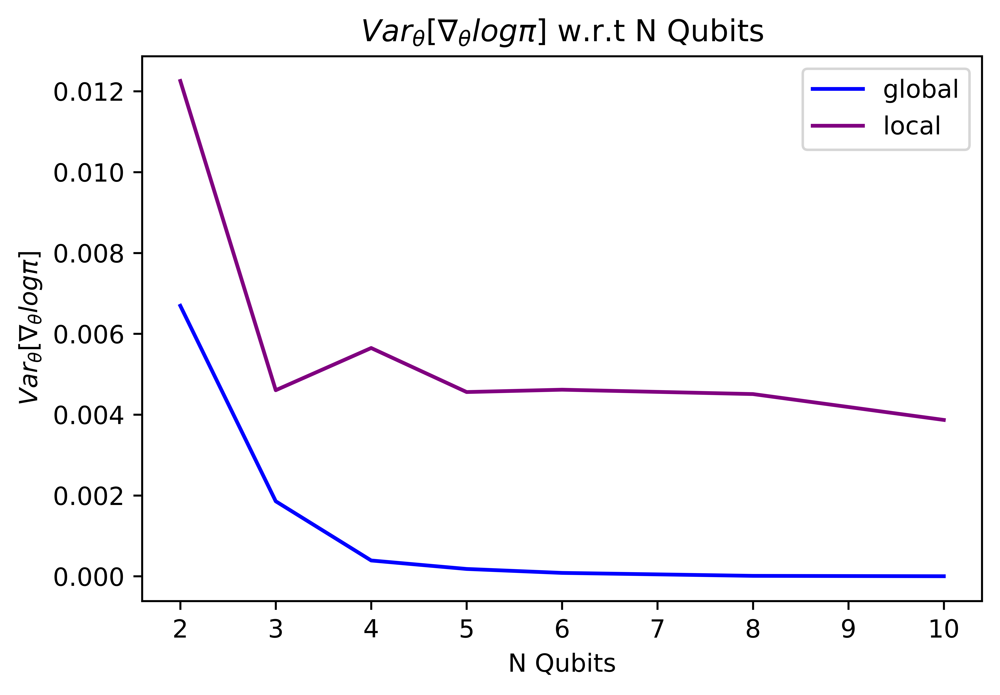

In [263]:
variances_global = np.array(variances_global)
variances_local = np.array(variances_local)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,variances_global, color="blue", label="global")
plt.plot(qubits,variances_local, color="purple", label="local")
plt.legend()

plt.title(r"$Var_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.xlabel("N Qubits")
plt.show()

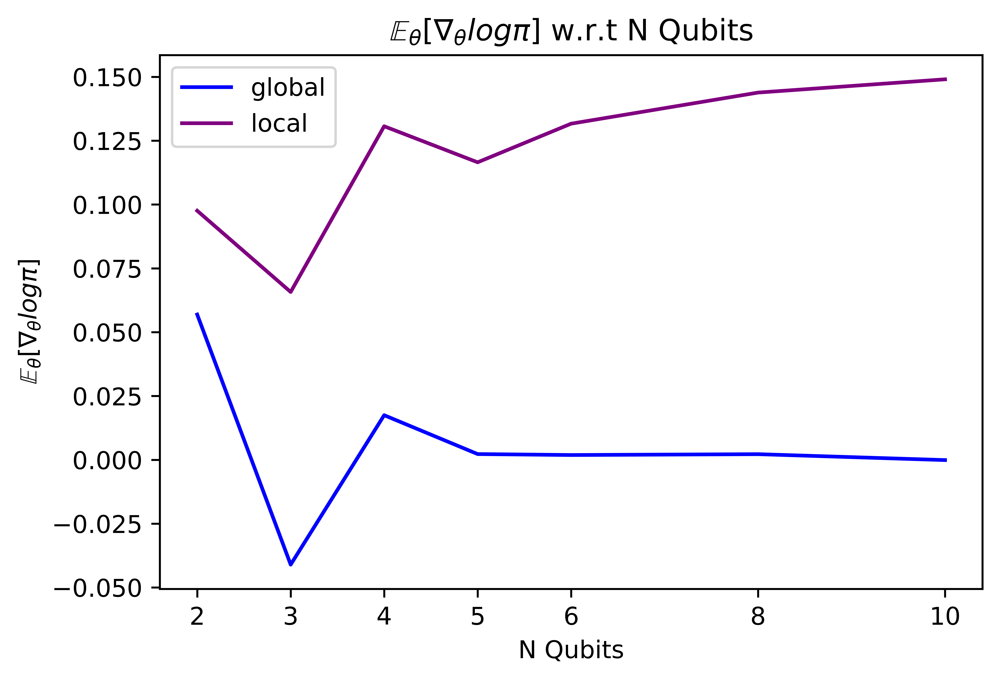

In [264]:
exp_global = np.array(exp_global)
exp_local = np.array(exp_local)
#variances_local_normal = np.array(variances_local_normal)
qubits = np.array(qubits)

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.plot(qubits,exp_global, color="blue", label="global")
plt.plot(qubits,exp_local, color="purple", label="local")
#plt.plot(qubits,variances_local_normal, color="darkorange" , label="local normal(0,1)")
plt.legend()
plt.xlabel("N Qubits")
plt.xticks(qubits)
plt.title(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$ w.r.t N Qubits")
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.show()

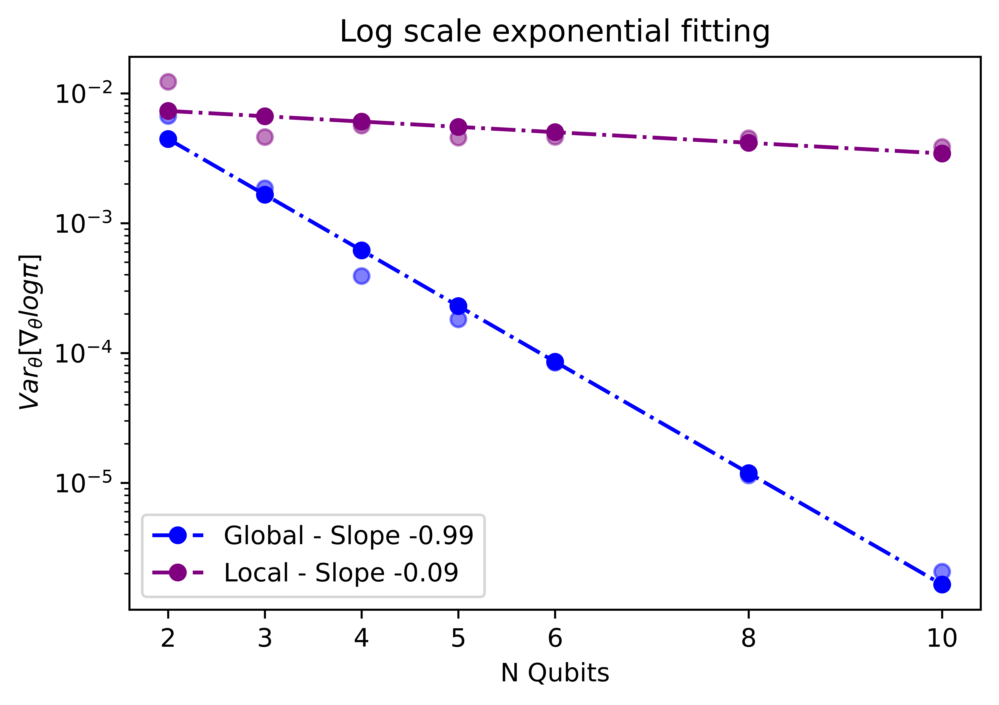

In [265]:
p = np.polyfit(qubits, np.log(variances_global), 1)
p2 = np.polyfit(qubits, np.log(variances_local), 1)

# Plot the straight line fit to the semilog
plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200
plt.semilogy(qubits, variances_global, "o" , color="blue" , alpha=0.5)
plt.semilogy(qubits, np.exp(p[0] * qubits + p[1]), "o-.", color="blue", label="Global - Slope {:3.2f}".format(p[0]))
plt.semilogy(qubits, variances_local, "o" , color="purple", alpha=0.5)
plt.semilogy(qubits,  np.exp(p2[0] * qubits + p2[1]), "o-.", color="purple", label="Local - Slope {:3.2f}".format(p2[0]))
plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend()
plt.title("Log scale exponential fitting")
plt.show()

## Strongly Entangling Layers with multiple layers <a name="SELLayers"></a>

In [2]:
def ansatz(weights, n_layers=1, change_of_basis=False, entanglement="all2all"):
        if change_of_basis==True:
            for i in range(n_qubits):
                qml.RZ(weights[-1][i][0],wires=i)
                qml.RY(weights[-1][i][1],wires=i)
                qml.RZ(weights[-1][i][2],wires=i)
        else:

            for l in range(n_layers):

                for i in range(len(weights[l])):
                    qml.RZ(weights[l][i][0],wires=i)
                    qml.RY(weights[l][i][1],wires=i)
                    qml.RZ(weights[l][i][2],wires=i)

                if entanglement == "all2all":
                    for q1 in range(n_qubits-1):    
                        for q2 in range(q1+1, n_qubits):
                            #qml.CNOT(wires=[q1,q2])
                            qml.CZ(wires=[q1,(q1+l+1)%n_qubits])

                
                elif entanglement == "mod":
                    if not (l+1)%n_qubits:
                        l=0
                    for q1 in range(n_qubits):
                        qml.CNOT(wires=[q1,(q1+l+1)%n_qubits])
                        #qml.CZ(wires=[q1,(q1+l+1)%n_qubits])

                elif entanglement == "linear":
                    for q1 in range(n_qubits-1):    
                        qml.CNOT(wires=[q1,q1+1])

                elif entanglement == "circular":
                    #if l+1 < n_layers:
                    for q1 in range(n_qubits):
                        qml.CNOT(wires=[q1,(q1+1)%n_qubits])
                        #qml.CZ(wires=[q1,(q1+1)%n_qubits])

                
                elif entanglement == "nn":
                    qml.CNOT(wires=[0,1])
                    qml.CNOT(wires=[2,3])
                    qml.CNOT(wires=[1,2])

In [1]:
import numpy as np
import pennylane as qml
import multiprocessing
import matplotlib.pyplot as plt
from helper_s2d import calculate_variances_SEL_softmax

qubits = [2, 4, 6, 8, 10, 12, 14, 16]
layers = [2,3,4,5,6]
num_samples = 500

variances_global_layers = []
variances_local_layers = []
exp_global_layers = []
exp_local_layers = []

for l in layers:
    print("-number of layers - ", l)
    with multiprocessing.Pool() as pool:
        results = pool.starmap(calculate_variances_SEL_softmax, [(l, n_qubits, num_samples) for n_qubits in qubits])

    variances_global, variances_local, exp_global, exp_local = zip(*results)
    variances_global_layers.append(variances_global)
    variances_local_layers.append(variances_local)
    exp_global_layers.append(exp_global)
    exp_local_layers.append(exp_local)

qubits = np.array(qubits)

-number of layers -  2
---Doing #qubits - 14
---Doing #qubits - 10
---Doing #qubits - 12
---Doing #qubits - 2
---Doing #qubits - 4
---Doing #qubits - 8
---Doing #qubits - 16
---Doing #qubits - 6
-number of layers -  3
---Doing #qubits - 8
---Doing #qubits - 6
---Doing #qubits - 2
---Doing #qubits - 12---Doing #qubits - 10

---Doing #qubits - 4
---Doing #qubits - 14
---Doing #qubits - 16
-number of layers -  4
---Doing #qubits - 2
---Doing #qubits - 6
---Doing #qubits - 14
---Doing #qubits - 4
---Doing #qubits - 8
---Doing #qubits - 12
---Doing #qubits - 16
---Doing #qubits - 10
-number of layers -  5
---Doing #qubits - 8
---Doing #qubits - 6
---Doing #qubits - 2
---Doing #qubits - 12
---Doing #qubits - 10
---Doing #qubits - 14
---Doing #qubits - 16
---Doing #qubits - 4
-number of layers -  6
---Doing #qubits - 6
---Doing #qubits - 8
---Doing #qubits - 4
---Doing #qubits - 2
---Doing #qubits - 16
---Doing #qubits - 10
---Doing #qubits - 14
---Doing #qubits - 12


/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:

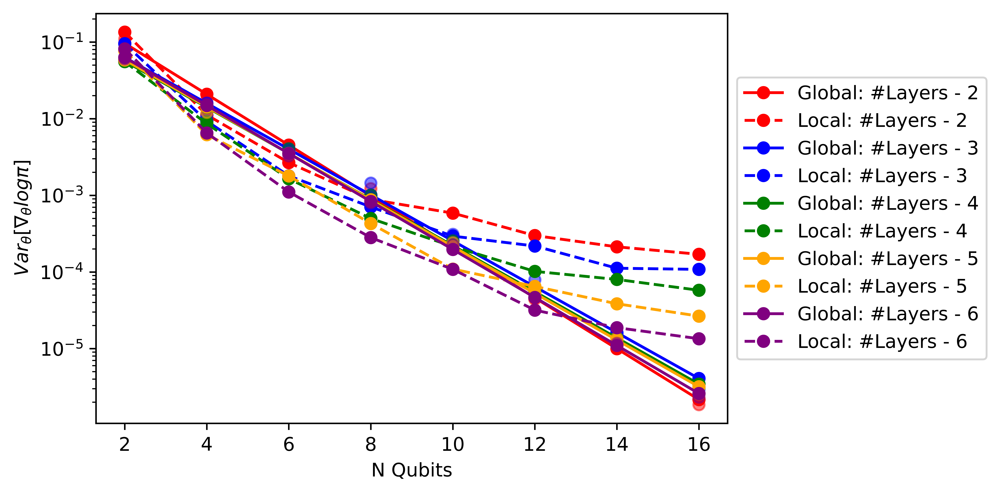

In [2]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(variances_global_layers[l]), 1))
    pl.append(np.polyfit(qubits, variances_local_layers[l],10))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, variances_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, variances_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:

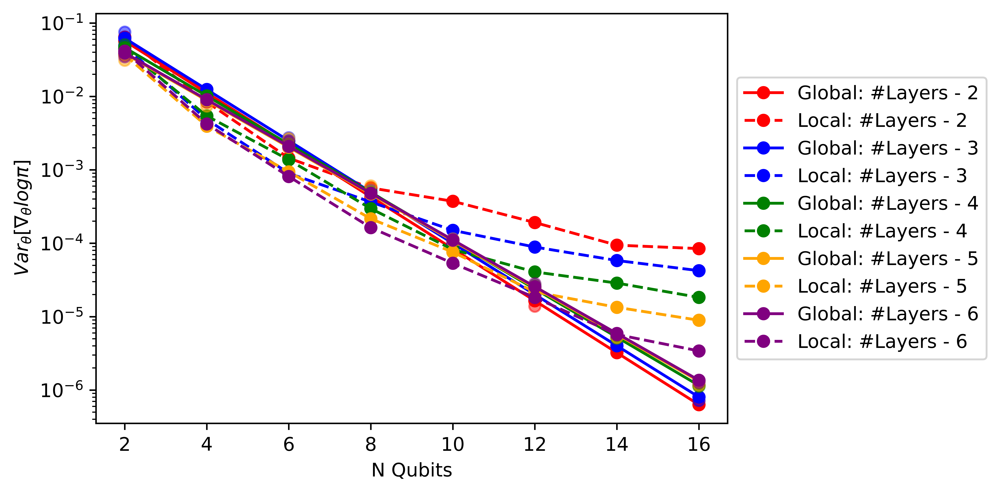

In [3]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(variances_global_layers[l]), 1))
    pl.append(np.polyfit(qubits, variances_local_layers[l], 10))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, variances_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, variances_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

/var/folders/n9/tdqdt7991733xw39nzh49y600000gn/T/ipykernel_80314/3586739306.py:6: RuntimeWarning: invalid value encountered in log
  pg.append(np.polyfit(qubits, np.log(exp_global_layers[l]), 1))


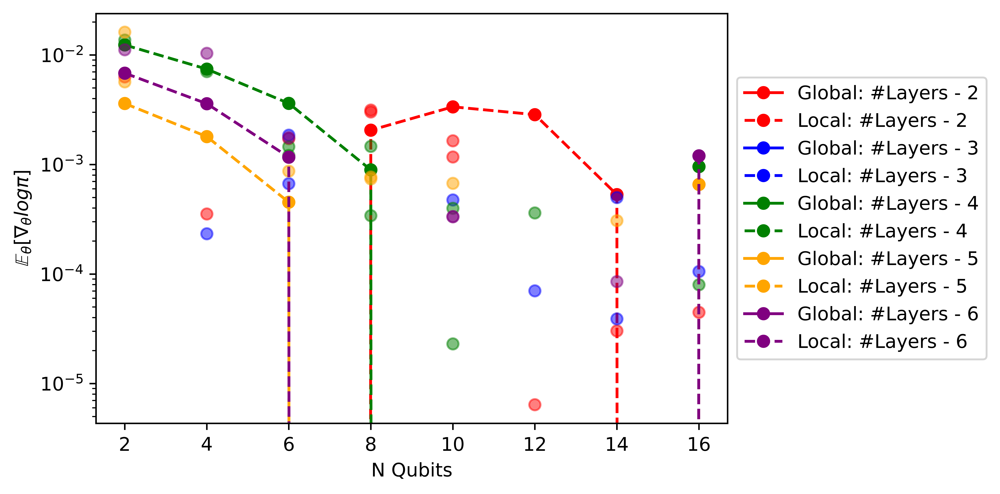

In [3]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(exp_global_layers[l]), 1))
    pl.append(np.polyfit(qubits, exp_local_layers[l], 12))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, exp_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, exp_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [4]:
np.save("SEL_softmax__var_global_U(-pi,pi)_FINAL.npy", variances_global_layers)
np.save("SEL_softmax__var_local_U(-pi,pi)_FINAL.npy", variances_local_layers)
np.save("SEL_softmax__exp_global_U(-pi,pi)_FINAL.npy", exp_global_layers)
np.save("SEL_softmax__exp_local_U(-pi,pi)_FINAL.npy", exp_local_layers)

## Random circuit with multiple layers <a name="randomlayers"></a>


In [1]:
import numpy as np
import pennylane as qml
import multiprocessing
import matplotlib.pyplot as plt
from helper_s2d import calculate_variances_RANDOM_softmax

qubits = [2, 4, 6, 8, 10, 12, 14, 16]
layers = [2,3,4,5,6]
num_samples = 500

variances_global_layers = []
variances_local_layers = []
exp_global_layers = []
exp_local_layers = []

for l in layers:
    print("-number of layers - ", l)
    with multiprocessing.Pool() as pool:
        results = pool.starmap(calculate_variances_RANDOM_softmax, [(l, n_qubits, num_samples) for n_qubits in qubits])

    variances_global, variances_local, exp_global, exp_local = zip(*results)
    variances_global_layers.append(variances_global)
    variances_local_layers.append(variances_local)
    exp_global_layers.append(exp_global)
    exp_local_layers.append(exp_local)

qubits = np.array(qubits)

-number of layers -  2
---Doing #qubits - 16
---Doing #qubits - 8
---Doing #qubits - 6
---Doing #qubits - 12
---Doing #qubits - 2
---Doing #qubits - 14
---Doing #qubits - 4
---Doing #qubits - 10
-number of layers -  3
---Doing #qubits - 2
---Doing #qubits - 6
---Doing #qubits - 4
---Doing #qubits - 8
---Doing #qubits - 16
---Doing #qubits - 12
---Doing #qubits - 10
---Doing #qubits - 14
-number of layers -  4
---Doing #qubits - 4
---Doing #qubits - 2
---Doing #qubits - 10
---Doing #qubits - 6
---Doing #qubits - 14
---Doing #qubits - 12
---Doing #qubits - 8
---Doing #qubits - 16
-number of layers -  5
---Doing #qubits - 4
---Doing #qubits - 6
---Doing #qubits - 2
---Doing #qubits - 8
---Doing #qubits - 16
---Doing #qubits - 10
---Doing #qubits - 12
---Doing #qubits - 14
-number of layers -  6
---Doing #qubits - 10
---Doing #qubits - 2
---Doing #qubits - 14
---Doing #qubits - 16
---Doing #qubits - 6
---Doing #qubits - 12
---Doing #qubits - 4
---Doing #qubits - 8


/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:3398: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/IPython/core/interactiveshell.py:

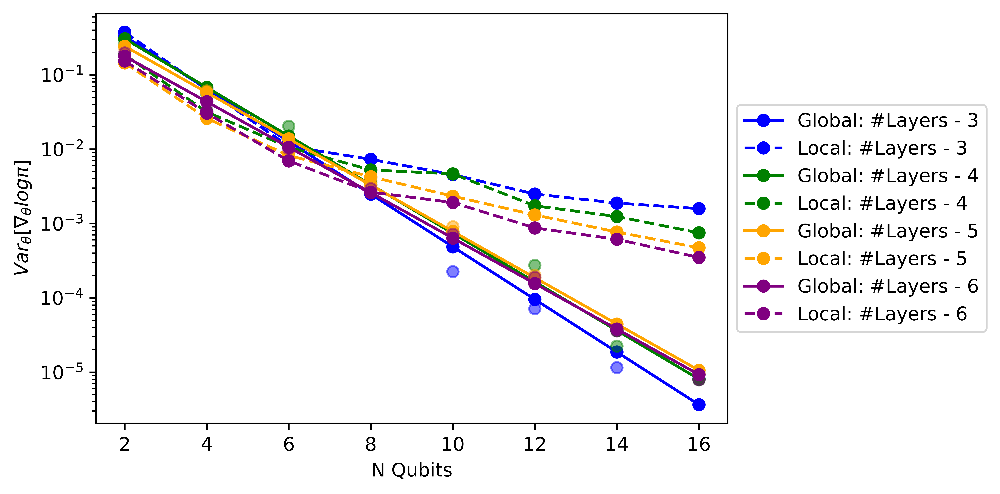

In [2]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(variances_global_layers[l]), 1))
    pl.append(np.polyfit(qubits, variances_local_layers[l],10))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(1,len(layers)):
    plt.semilogy(qubits, variances_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, variances_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [23]:
0.4*(6/3)

0.8

In [5]:
np.save("RANDOM_softmax__var_global_U(-pi,pi)_FINAL.npy", variances_global_layers)
np.save("RANDOM_softmax__var_local_U(-pi,pi)_FINAL.npy", variances_local_layers)
np.save("RANDOM_softmax__exp_global_U(-pi,pi)_FINAL.npy", exp_global_layers)
np.save("RANDOM_softmax__exp_local_U(-pi,pi)_FINAL.npy", exp_local_layers)

## Simplified 2-design

In [1]:
import pennylane as qml
from pennylane import numpy as np
import multiprocessing
import matplotlib.pyplot as plt
from helper_s2d import calculate_variances_S2d_softmax

qubits = [2, 4, 6, 8, 10, 12, 14, 16]
layers = [2,3,4,5,6]
num_samples = 500

variances_global_layers = []
variances_local_layers = []
exp_global_layers = []
exp_local_layers = []

for l in layers:
    print("-number of layers - ", l)
    with multiprocessing.Pool() as pool:
        
        results = pool.starmap(calculate_variances_S2d_softmax, [(l, n_qubits, num_samples) for n_qubits in qubits])

    variances_global, variances_local, exp_global, exp_local = zip(*results)
    variances_global_layers.append(variances_global)
    variances_local_layers.append(variances_local)
    exp_global_layers.append(exp_global)

    exp_local_layers.append(exp_local)

qubits = np.array(qubits)

-number of layers -  2
---Doing #qubits - 4
---Doing #qubits - 2
---Doing #qubits - 12
---Doing #qubits - 6
---Doing #qubits - 14
---Doing #qubits - 8
---Doing #qubits - 10
---Doing #qubits - 16
-number of layers -  3
---Doing #qubits - 4
---Doing #qubits - 6
---Doing #qubits - 2
---Doing #qubits - 10
---Doing #qubits - 14
---Doing #qubits - 12
---Doing #qubits - 16
---Doing #qubits - 8
-number of layers -  4
---Doing #qubits - 2
---Doing #qubits - 10
---Doing #qubits - 6
---Doing #qubits - 14
---Doing #qubits - 4
---Doing #qubits - 12
---Doing #qubits - 16
---Doing #qubits - 8
-number of layers -  5
---Doing #qubits - 4
---Doing #qubits - 2
---Doing #qubits - 10
---Doing #qubits - 8
---Doing #qubits - 6
---Doing #qubits - 16
---Doing #qubits - 14
---Doing #qubits - 12
-number of layers -  6
---Doing #qubits - 2
---Doing #qubits - 6
---Doing #qubits - 14
---Doing #qubits - 12
---Doing #qubits - 4
---Doing #qubits - 8
---Doing #qubits - 10
---Doing #qubits - 16


/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)


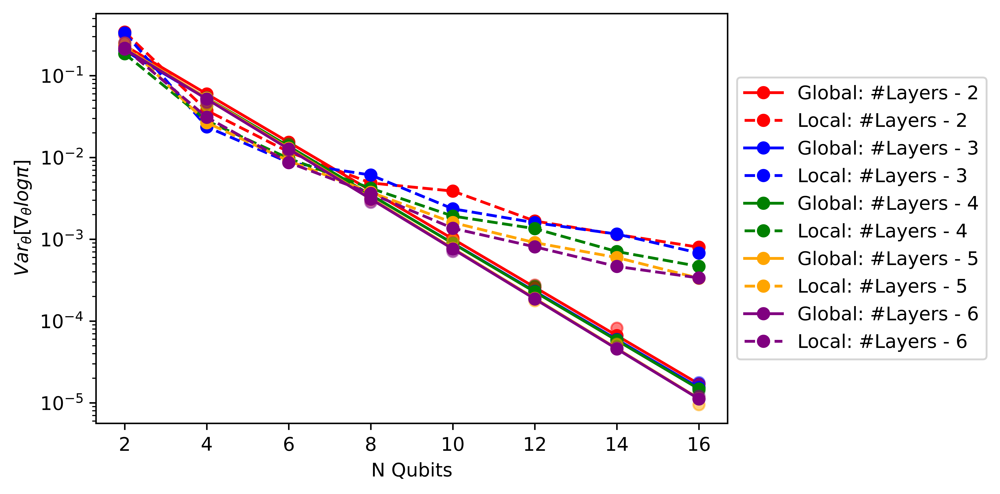

In [2]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(variances_global_layers[l]), 1))
    #pg.append(np.polyfit(qubits, variances_global_layers[l], 5))
    pl.append(np.polyfit(qubits, variances_local_layers[l],20))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, variances_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))
    #plt.semilogy(qubits, np.polyval(pg[l],qubits), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, variances_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


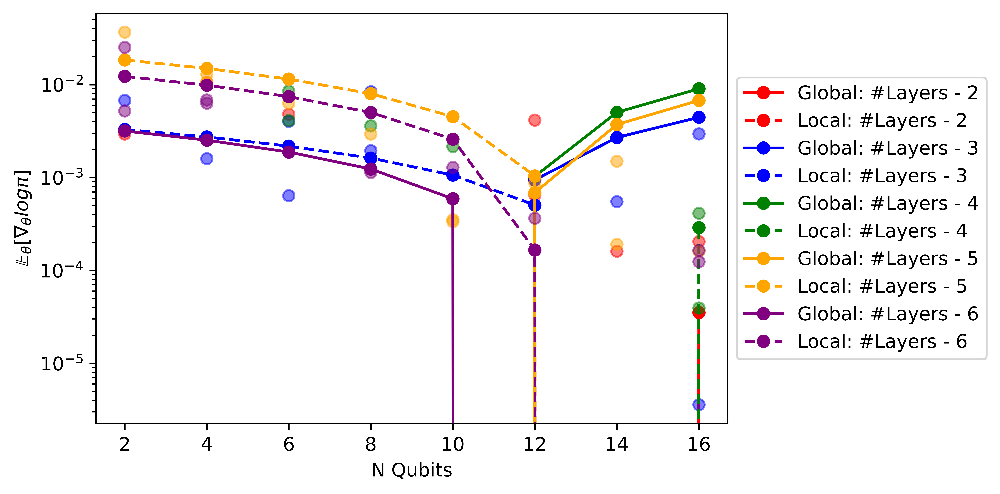

In [21]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    #pg.append(np.polyfit(qubits, np.log(exp_global_layers[l]), 1))
    pg.append(np.polyfit(qubits, exp_global_layers[l], 1))
    pl.append(np.polyfit(qubits, exp_local_layers[l], 1))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, exp_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pg[l],qubits), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))
    #plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, exp_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [3]:
np.save("S2d_softmax__var_global_U(-pi,pi)_FINAL.npy", variances_global_layers)
np.save("S2d_softmax__var_local_U(-pi,pi)_FINAL.npy", variances_local_layers)
np.save("S2d_softmax__exp_global_U(-pi,pi)_FINAL.npy", exp_global_layers)
np.save("S2d_softmax__exp_local_U(-pi,pi)_FINAL.npy", exp_local_layers)

### Ciao for now ! :)

## Data reuploading

In [1]:
import pennylane as qml
from pennylane import numpy as np
import multiprocessing
import matplotlib.pyplot as plt
from helper_s2d import calculate_variances_data_reuploading

qubits = [2, 4, 6, 8, 10]#), 12, 14, 16]
layers = [2,3,4,5,6]
num_samples = 500

variances_global_layers = []
variances_local_layers = []
exp_global_layers = []
exp_local_layers = []

for l in layers:
    print("-number of layers - ", l)
    with multiprocessing.Pool() as pool:
        
        results = pool.starmap(calculate_variances_data_reuploading, [(l, n_qubits, num_samples) for n_qubits in qubits])

    variances_global, variances_local, exp_global, exp_local = zip(*results)
    variances_global_layers.append(variances_global)
    variances_local_layers.append(variances_local)
    exp_global_layers.append(exp_global)

    exp_local_layers.append(exp_local)

qubits = np.array(qubits)

-number of layers -  2
---Doing #qubits - 4
---Doing #qubits - 2
---Doing #qubits - 6
---Doing #qubits - 10
---Doing #qubits - 8
-number of layers -  3
---Doing #qubits - 2
---Doing #qubits - 8
---Doing #qubits - 4
---Doing #qubits - 6
---Doing #qubits - 10
-number of layers -  4
---Doing #qubits - 6
---Doing #qubits - 4
---Doing #qubits - 10
---Doing #qubits - 8
---Doing #qubits - 2
-number of layers -  5
---Doing #qubits - 8
---Doing #qubits - 4
---Doing #qubits - 6
---Doing #qubits - 10
---Doing #qubits - 2
-number of layers -  6
---Doing #qubits - 2
---Doing #qubits - 6
---Doing #qubits - 4
---Doing #qubits - 10
---Doing #qubits - 8


/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)


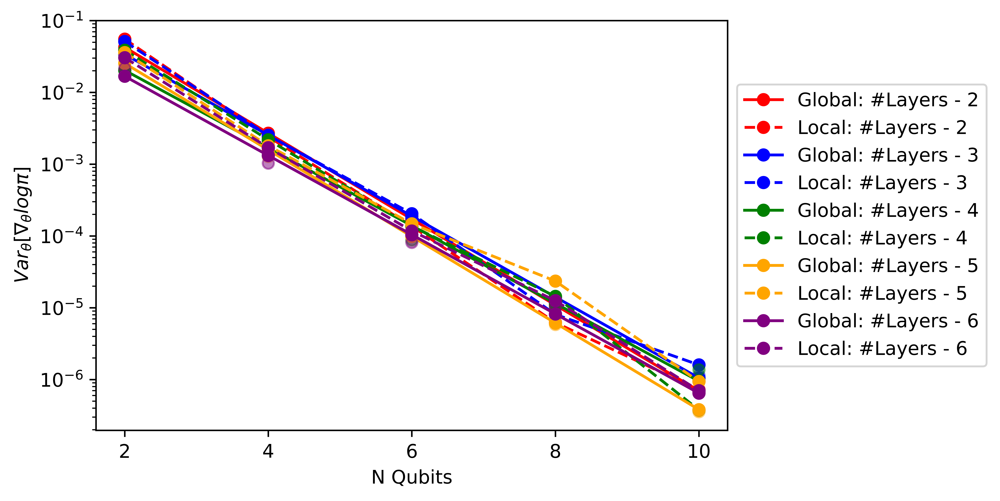

In [2]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    pg.append(np.polyfit(qubits, np.log(variances_global_layers[l]), 1))
    #pg.append(np.polyfit(qubits, variances_global_layers[l], 5))
    pl.append(np.polyfit(qubits, variances_local_layers[l],20))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, variances_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))
    #plt.semilogy(qubits, np.polyval(pg[l],qubits), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, variances_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$Var_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [3]:
np.save("UAT_reuploading_nolog__var_U(-pi,pi).npy", variances_global_layers)
np.save("UAT_no_reuploading_nolog_var_U(-pi,pi).npy", variances_local_layers)
#np.save("S2d_softmax__exp_global_U(-pi,pi)_FINAL.npy", exp_global_layers)
#np.save("S2d_softmax__exp_local_U(-pi,pi)_FINAL.npy", exp_local_layers)

/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/quantum_DS/lib/python3.10/site-packages/pennylane/numpy/wrapper.py:117: RankWarning: Polyfit may be poorly conditioned
  res = obj(*args, **kwargs)
/opt/homebrew/Caskroom/miniforge/base/envs/qu

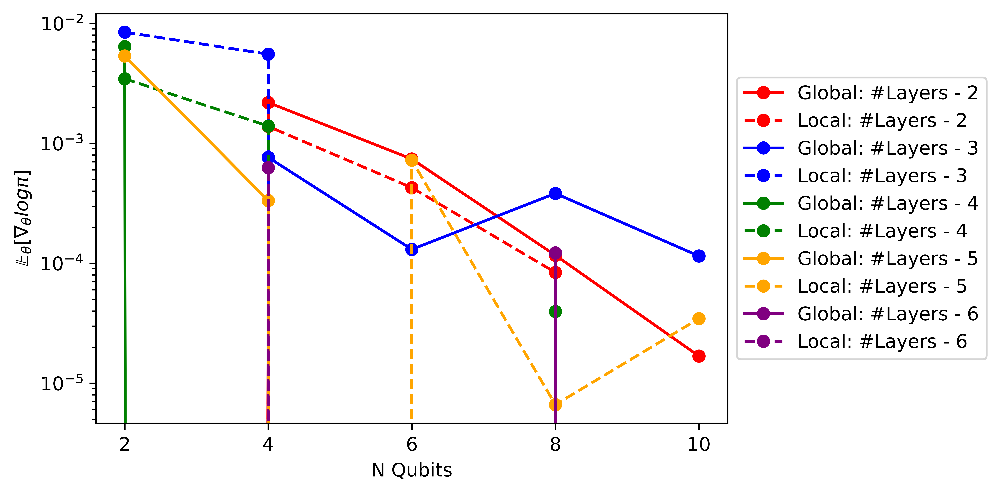

In [4]:
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan']

pg = []
pl = []
for l in range(len(layers)):
    #pg.append(np.polyfit(qubits, np.log(exp_global_layers[l]), 1))
    pg.append(np.polyfit(qubits, exp_global_layers[l], 10))
    pl.append(np.polyfit(qubits, exp_local_layers[l], 10))

plt.rcParams['figure.dpi'] = 1200
plt.rcParams['savefig.dpi'] = 1200

for l in range(len(layers)):
    plt.semilogy(qubits, exp_global_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pg[l],qubits), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))
    #plt.semilogy(qubits, np.exp(pg[l][0] * qubits + pg[l][1]), "o-", color=colors[l % len(colors)], label="Global: #Layers - {}".format(layers[l]))

    plt.semilogy(qubits, exp_local_layers[l], "o", color=colors[l % len(colors)], alpha=0.5)
    plt.semilogy(qubits, np.polyval(pl[l], qubits), "o--", color=colors[l % len(colors)], label="Local: #Layers - {}".format(layers[l]))

plt.xlabel(r"N Qubits")
plt.xticks(qubits)
plt.ylabel(r"$\mathbb{E}_\theta [\nabla_\theta log \pi]$")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()
